# Preliminary analysis of RCA in vivo conditions

In [30]:
import os, sys
import tifffile as tif
import numpy as np
import matplotlib.pyplot as plt
import tqdm
import pandas as pd
import colorcet as cc
import cv2
import skimage
import scipy.ndimage, scipy.stats

In [25]:
from cellpose import models, utils

## Set up directory

In [55]:
data_dir = "/mnt/central_nas/users/ychian/Exp/202503_IMC_inten_encoding/20250415_eGFP_in_vivo_RCA/processed"

# list of all files in the directory
files = os.listdir(data_dir)
files = [os.path.join(data_dir, f) for f in files if f.endswith('.tif')]
files.sort()
files

['/mnt/central_nas/users/ychian/Exp/202503_IMC_inten_encoding/20250415_eGFP_in_vivo_RCA/processed/G1_40x_1.tif',
 '/mnt/central_nas/users/ychian/Exp/202503_IMC_inten_encoding/20250415_eGFP_in_vivo_RCA/processed/G3_40x_1.tif',
 '/mnt/central_nas/users/ychian/Exp/202503_IMC_inten_encoding/20250415_eGFP_in_vivo_RCA/processed/G3_40x_1_focus.tif',
 '/mnt/central_nas/users/ychian/Exp/202503_IMC_inten_encoding/20250415_eGFP_in_vivo_RCA/processed/G4_40x_1.tif',
 '/mnt/central_nas/users/ychian/Exp/202503_IMC_inten_encoding/20250415_eGFP_in_vivo_RCA/processed/G4_40x_1_composite.tif',
 '/mnt/central_nas/users/ychian/Exp/202503_IMC_inten_encoding/20250415_eGFP_in_vivo_RCA/processed/G4_40x_2_focus.tif',
 '/mnt/central_nas/users/ychian/Exp/202503_IMC_inten_encoding/20250415_eGFP_in_vivo_RCA/processed/G4_40x_2_focus_cropped.tif',
 '/mnt/central_nas/users/ychian/Exp/202503_IMC_inten_encoding/20250415_eGFP_in_vivo_RCA/processed/W1_40x_1.tif',
 '/mnt/central_nas/users/ychian/Exp/202503_IMC_inten_encodin

In [56]:
file = files[11]
print(file)
img = tif.imread(file)
img_nuc = img[0,:,:]
img_488 = img[1,:,:]
img_555 = img[2,:,:]

/mnt/central_nas/users/ychian/Exp/202503_IMC_inten_encoding/20250415_eGFP_in_vivo_RCA/processed/W4_40x_1_focus.tif


## Exploratory analysis

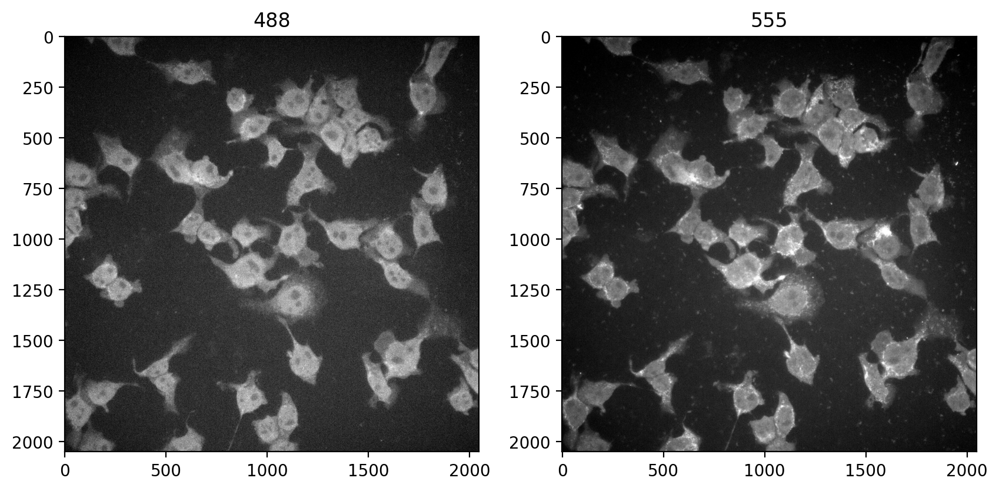

In [57]:
plt.figure(figsize=(10, 5), dpi=200)
plt.subplot(121)
plt.imshow(img_488, cmap='gray')
plt.clim(np.percentile(img_488, 5), np.percentile(img_488, 99.9))
plt.title("488")
plt.subplot(122)
plt.imshow(img_555, cmap='gray')
plt.clim(np.percentile(img_555, 5), np.percentile(img_555, 99.9))
plt.title("555")
plt.show()

Plot a line profile in the diagonal direction

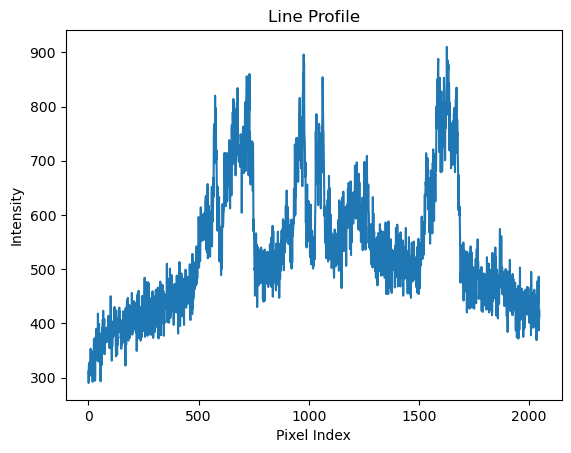

In [58]:
def plot_line_profile(img, start, end):
    # Create a mask for the line
    mask = np.zeros_like(img, dtype=np.uint8)
    cv2.line(mask, start, end, 255, 1)

    # Get the coordinates of the line
    coords = np.column_stack(np.where(mask > 0))

    # Get the pixel values along the line
    line_values = img[coords[:, 0], coords[:, 1]]

    # Plot the line profile
    plt.plot(line_values)
    plt.xlabel('Pixel Index')
    plt.ylabel('Intensity')
    plt.title('Line Profile')
    plt.show()
# Define the start and end points of the line
start = (0, 0)
end = (img_488.shape[1] - 1, img_488.shape[0] - 1)
# Plot the line profile for the first image
plot_line_profile(img_555, start, end)

## Amplicon masking and binarization

Difference of guassian and then local maxima to detect spots

In [59]:
def vis_roll_ball(img, radius):
    # slightly blur the image to remove noise
    img = cv2.GaussianBlur(img, (5, 5), 0)
    # rolling ball algorithm to remove background
    background = skimage.restoration.rolling_ball(img, radius=radius)
    img_sub = img - background
    
    # set figure size
    plt.figure(figsize=(15, 5))
    plt.subplot(131)
    plt.imshow(img, cmap='gray')
    plt.title('Original Image')
    plt.clim(np.percentile(img, 5), np.percentile(img, 99.9))
    plt.axis('off')

    plt.subplot(132)
    plt.imshow(background, cmap='gray')
    plt.title('Background')
    plt.clim(np.percentile(background, 5), np.percentile(background, 99.9))
    plt.axis('off')

    plt.subplot(133)
    plt.imshow(img_sub, cmap='gray')
    plt.title('Subtracted Image')
    plt.clim(np.percentile(img_sub, 5), np.percentile(img_sub, 99.9))
    plt.axis('off')

    plt.show()

    start = (0, 0)
    end = (img_sub.shape[1] - 1, img_sub.shape[0] - 1)
    plot_line_profile(img_sub, start, end)
    
def vis_gaussian(img, sigma1, sigma2):
    # difference of guassian sigma1 = 2, sigma2 = 10
    img_sig1 = skimage.filters.gaussian(img, sigma=sigma1, preserve_range=True)
    img_sig2 = skimage.filters.gaussian(img, sigma=sigma2, preserve_range=True)
    img_sub = img_sig1 - img_sig2
    
    return img_sub

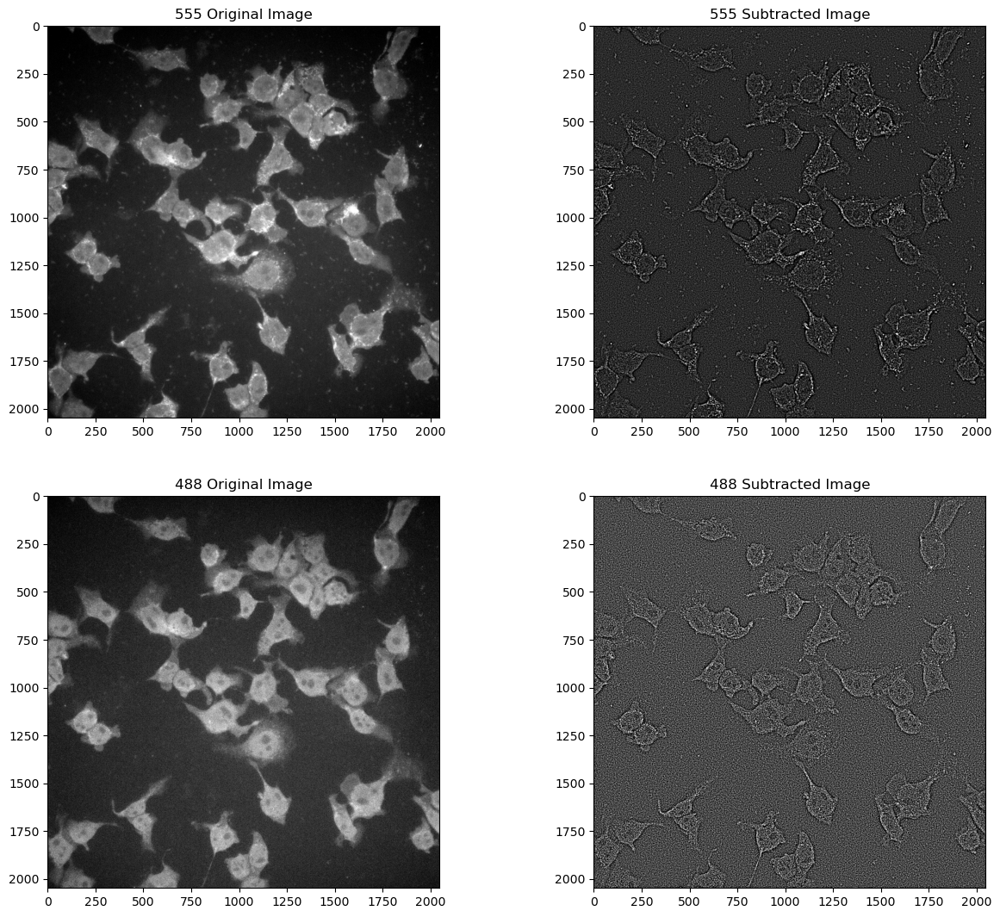

In [60]:
sigma_1 = 1.5
sigma_2 = 3


img_555_sub = vis_gaussian(img_555, sigma_1, sigma_2)
img_488_sub = vis_gaussian(img_488, sigma_1, sigma_2)

plt.figure(figsize=(15, 13), dpi=100)
plt.subplot(221)
plt.imshow(img_555, cmap='gray')
plt.title('555 Original Image')
plt.clim(np.percentile(img_555, 5), np.percentile(img_555, 99.9))
# plt.axis('off')
plt.subplot(222)
plt.imshow(img_555_sub, cmap='gray')
plt.title('555 Subtracted Image')
plt.clim(np.percentile(img_555_sub, 5), np.percentile(img_555_sub, 99.9))
# plt.axis('off')
plt.subplot(223)
plt.imshow(img_488, cmap='gray')
plt.title('488 Original Image')
plt.clim(np.percentile(img_488, 5), np.percentile(img_488, 99.9))
# plt.axis('off')
plt.subplot(224)
plt.imshow(img_488_sub, cmap='gray')
plt.title('488 Subtracted Image')
plt.clim(np.percentile(img_488_sub, 5), np.percentile(img_488_sub, 99.9))
# plt.axis('off')
plt.show()

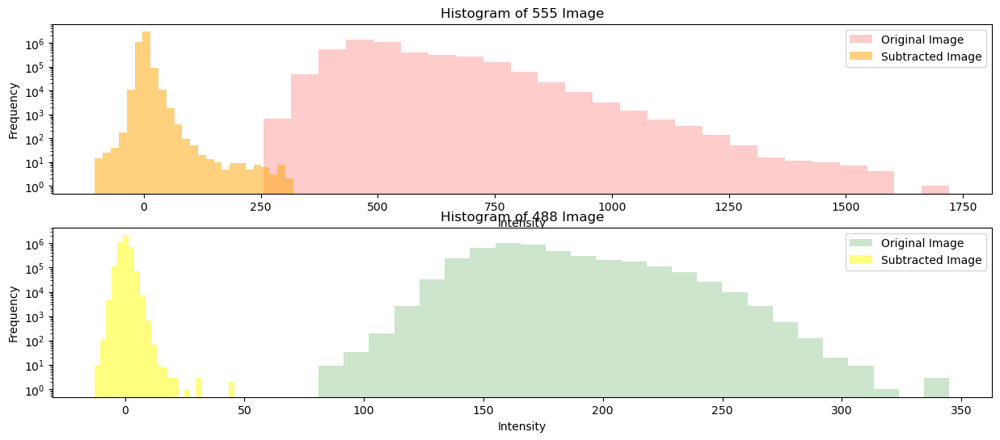

In [61]:

# plot the histogram before and after background subtraction
plt.figure(figsize=(15, 6), dpi=100)
plt.subplot(211)
# plt.hist(img_555_background.flatten(), bins=5, color='gray', alpha=0.5, label='Background Image')
plt.hist(img_555.flatten(), bins=25, color='red', alpha=0.2, label='Original Image')
plt.hist(img_555_sub.flatten(), bins=25, color='orange', alpha=0.5, label='Subtracted Image')
plt.title('Histogram of 555 Image')
plt.xlabel('Intensity')
plt.ylabel('Frequency')
# set y into log
plt.yscale('log')
plt.legend()
plt.subplot(212)
# plt.hist(img_488_background.flatten(), bins=5, color='gray', alpha=0.5, label='Background Image')
plt.hist(img_488.flatten(), bins=25, color='green', alpha=0.2, label='Original Image')
plt.hist(img_488_sub.flatten(), bins=25, color='yellow', alpha=0.5, label='Subtracted Image')
plt.title('Histogram of 488 Image')
plt.xlabel('Intensity')
plt.ylabel('Frequency')
plt.yscale('log')
plt.legend()
plt.show()

Local max (circular kernel)

In [62]:
def maximum_filter(img, radius):
    # set a circular kernel
    kernel = cv2.circle(np.zeros((radius*2+1, radius*2+1), dtype=np.uint8), (radius, radius), radius, 1, -1)
    
    # apply the maximum filter using the circular kernel, consider a reflective border
    img_max = cv2.dilate(img, kernel, iterations=1)
    return img_max

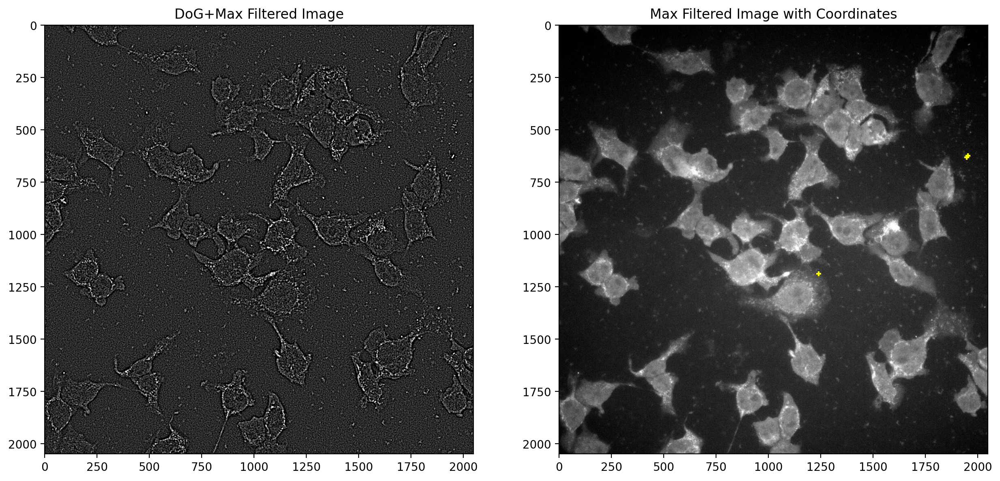

In [63]:
# img_555_max = scipy.ndimage.maximum_filter(img_555_sub, size=5)
img_555_max = maximum_filter(img_555_sub, radius=0)
thres = 200
coordinates = skimage.feature.peak_local_max(img_555_sub, min_distance=5, threshold_abs=thres)

plt.figure(figsize=(15, 10), dpi=200)
plt.subplot(121)
plt.imshow(img_555_max, cmap='gray')
plt.title('DoG+Max Filtered Image')
plt.clim(np.percentile(img_555_max, 5), np.percentile(img_555_max, 99.9))
# plt.xlim(500, 1000)
# plt.ylim(2000, 1500)
# plt.colorbar()

plt.subplot(122)
plt.imshow(img_555, cmap='gray')
plt.title('Max Filtered Image with Coordinates')
plt.clim(np.percentile(img_555, 5), np.percentile(img_555, 99.9))

# plt.colorbar()
# overlay the coordinates on the image
for coord in coordinates:
    plt.scatter(coord[1], coord[0], c='yellow', s=20, marker = '+')
    
# plt.xlim(500, 1000)
# plt.ylim(2000, 1500)
    
plt.show()

whole-amplicon intensity correlation

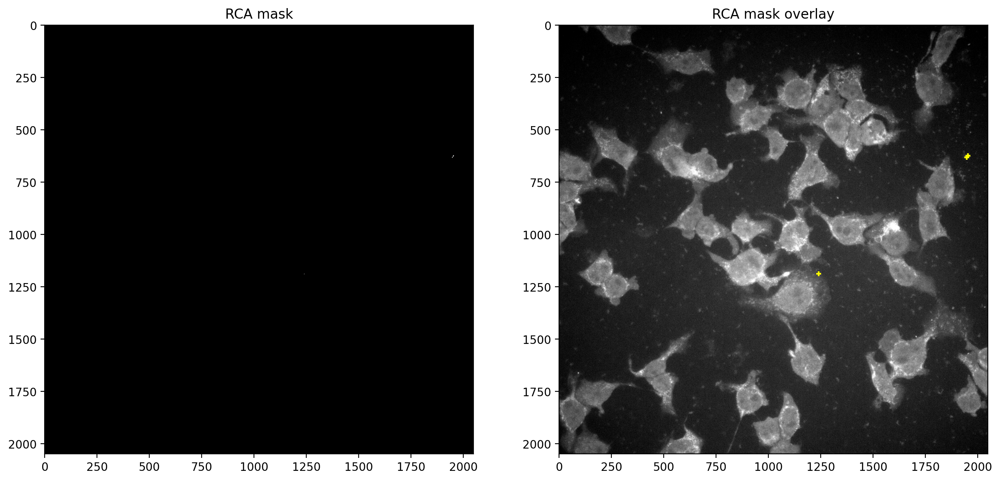

In [64]:
img_mask = img_555_max > thres

plt.figure(figsize=(15, 10), dpi = 200)
plt.subplot(121)
plt.imshow(img_mask, cmap='gray')
plt.title('RCA mask')
plt.clim(0, 1)
# plt.xlim(1000, 1250)
# plt.ylim(1000, 1250)

plt.subplot(122)
plt.imshow(img_555, cmap='gray')
plt.title('RCA mask overlay')
plt.clim(np.percentile(img_555, 5), np.percentile(img_555, 99.9))
# overlay the coordinates on the image
for coord in coordinates:
    plt.scatter(coord[1], coord[0], c='yellow', s=20, marker = '+')
# plt.xlim(1000, 1250)
# plt.ylim(1000, 1250)
plt.show()

In [65]:
# turn the mask into a label image
img_mask = skimage.measure.label(img_mask)
img_555_df = skimage.measure.regionprops_table(img_mask, img_555, properties=['label', 'centroid', 'area', 'mean_intensity'])

In [66]:
amp_df = pd.DataFrame(img_555_df)

# add one column to store area*mean_intensity as total_intensity
amp_df['total_intensity'] = amp_df['area'] * amp_df['mean_intensity']

# change the column name "centroid-0" to "y"
amp_df.rename(columns={'centroid-0': 'y'}, inplace=True)
# change the column name "centroid-1" to "x"
amp_df.rename(columns={'centroid-1': 'x'}, inplace=True)

amp_df

,label,y,x,area,mean_intensity,total_intensity
0,1,626.666667,1950.083333,36.0,1423.083333,51231.0
1,2,1188.200000,1239.600000,5.0,1499.400000,7497.0


## Cytosol masking and binarization

In [67]:
model_cyto = models.Cellpose(model_type="cyto3")
model_nuc = models.Cellpose(model_type="nuclei")

In [68]:
channels = [[0, 0]]

cmasks, cflows, cstyles, cdiams = model_cyto.eval(img_488, diameter=None, channels = channels)
nmasks, nflows, nstyles, ndiams = model_nuc.eval(img_nuc, diameter=None, channels = channels)

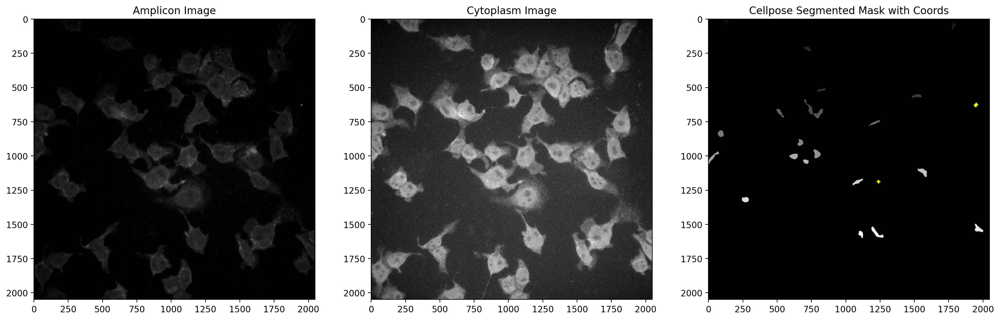

In [69]:
plt.figure(figsize=(20, 10), dpi=200)
plt.subplot(131)
plt.imshow(img_555, cmap='gray')
plt.title('Amplicon Image')
plt.clim(500, 2000)
plt.subplot(132)
plt.imshow(img_488, cmap='gray')
plt.title('Cytoplasm Image')
plt.clim(np.percentile(img_488, 5), np.percentile(img_488, 99.9))
plt.subplot(133)
plt.imshow(cmasks, cmap='gray')
plt.title('Cellpose Segmented Mask with Coords')
for coord in coordinates:
    plt.scatter(coord[1], coord[0], c='yellow', s=20, marker = '+')

plt.show()

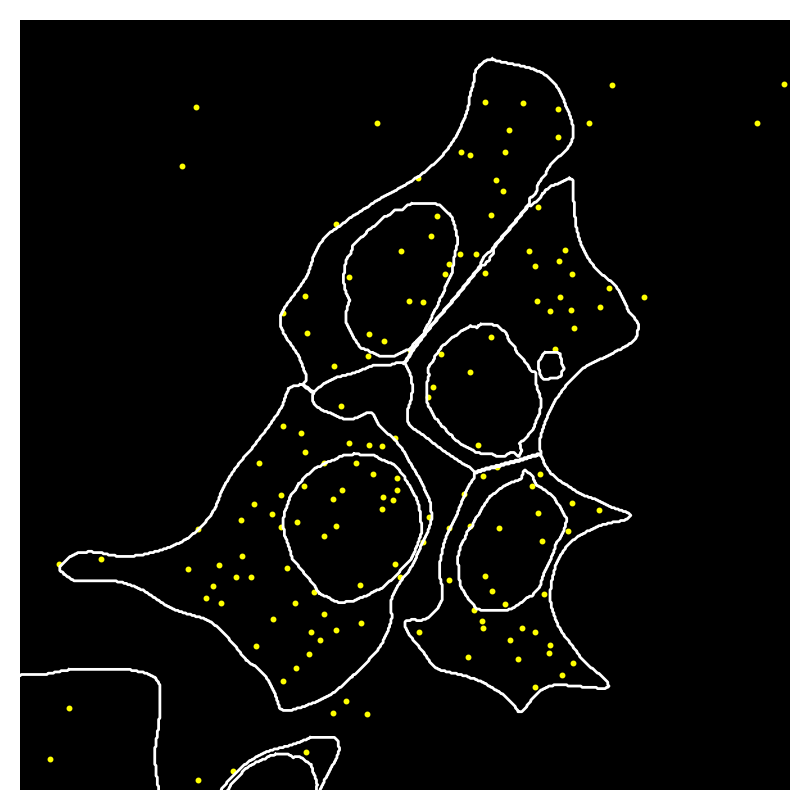

In [48]:
# convert the mask to a contour
cmask_contour = utils.outlines_list(cmasks)
bmask_contour = utils.outlines_list(nmasks)

# plot the contour of cmask and bmask on the same image
plt.figure(figsize=(5, 5), dpi=200)
psudo_img = np.zeros_like(img_555)
plt.imshow(psudo_img, cmap='gray', clim=(0, 1))
# plt.imshow(img_555, cmap=cc.cm.fire, clim=(500, 2000))
# add contour of cmask
lw=1
for contour in cmask_contour:
    plt.plot(contour[:, 0], contour[:, 1], color='white', linewidth=lw)
# add contour of bmask
for contour in bmask_contour:
    plt.plot(contour[:, 0], contour[:, 1], color='white', linewidth=lw)
for coord in coordinates:
    plt.scatter(coord[1], coord[0], c='yellow', s=5, marker = '.')
# set black background
plt.axis('off')

plt.xlim(1412, 2012)
plt.ylim(1118, 518)
plt.show()


In [49]:
# generate a df for the cellpose mask
cyto_df = skimage.measure.regionprops_table(cmasks, img_488, properties=['label', 'centroid', 'area', 'mean_intensity'])
cyto_df = pd.DataFrame(cyto_df)

cyto_df['total_intensity'] = cyto_df['area'] * cyto_df['mean_intensity']

# change the column name "centroid-0" to "y"
cyto_df.rename(columns={'centroid-0': 'y'}, inplace=True)
# change the column name "centroid-1" to "x"
cyto_df.rename(columns={'centroid-1': 'x'}, inplace=True)

cyto_df

,label,y,x,area,mean_intensity,total_intensity
0,1,306.488152,979.389821,22536.0,7473.858715,168430880.0
1,2,365.939183,225.287193,19123.0,9744.794175,186349699.0
2,3,570.442530,508.714705,33078.0,12288.269061,406471364.0
3,4,496.121903,878.823621,25553.0,23110.031660,590530639.0
4,5,560.809539,349.953724,19038.0,10565.582362,201147557.0
5,6,567.740106,720.784682,23802.0,10197.683052,242725252.0
6,7,682.227359,1729.724327,25396.0,6268.688770,159199620.0
7,8,700.969071,1201.261713,20660.0,9900.643901,204547303.0
8,9,766.990772,1798.446320,22215.0,7696.422777,170976032.0
9,10,831.821627,811.308414,25884.0,9176.453832,237523331.0


## Cell-dependent amplicon analysis

In [50]:
# for each mask (with label) in the cellpose mask, find the corresponding RCA mask, add the "amplicon_count" column to the cyto_df, add the "cyto_label" column to the amp_df
cyto_df['amplicon_count'] = 0
amp_df['cyto_label'] = 0

for i in range(len(cyto_df)):
    # get the label of the cellpose mask
    label = cyto_df['label'][i]
    amp_count = 0
    for j in range(len(amp_df)):
        amp_x = amp_df['x'][j].astype(int)
        amp_y = amp_df['y'][j].astype(int)
        amp_label = cmasks[amp_y, amp_x]
        if amp_label == label:
            amp_count += 1
            amp_df.loc[j, 'cyto_label'] = label
    cyto_df.loc[i, 'amplicon_count'] = amp_count
cyto_df['amplicon_count'] = cyto_df['amplicon_count'].astype(int)
amp_df['cyto_label'] = amp_df['cyto_label'].astype(int)

In [51]:
cyto_df

,label,y,x,area,mean_intensity,total_intensity,amplicon_count
0,1,306.488152,979.389821,22536.0,7473.858715,168430880.0,18
1,2,365.939183,225.287193,19123.0,9744.794175,186349699.0,29
2,3,570.442530,508.714705,33078.0,12288.269061,406471364.0,40
3,4,496.121903,878.823621,25553.0,23110.031660,590530639.0,50
4,5,560.809539,349.953724,19038.0,10565.582362,201147557.0,30
5,6,567.740106,720.784682,23802.0,10197.683052,242725252.0,26
6,7,682.227359,1729.724327,25396.0,6268.688770,159199620.0,29
7,8,700.969071,1201.261713,20660.0,9900.643901,204547303.0,26
8,9,766.990772,1798.446320,22215.0,7696.422777,170976032.0,22
9,10,831.821627,811.308414,25884.0,9176.453832,237523331.0,37


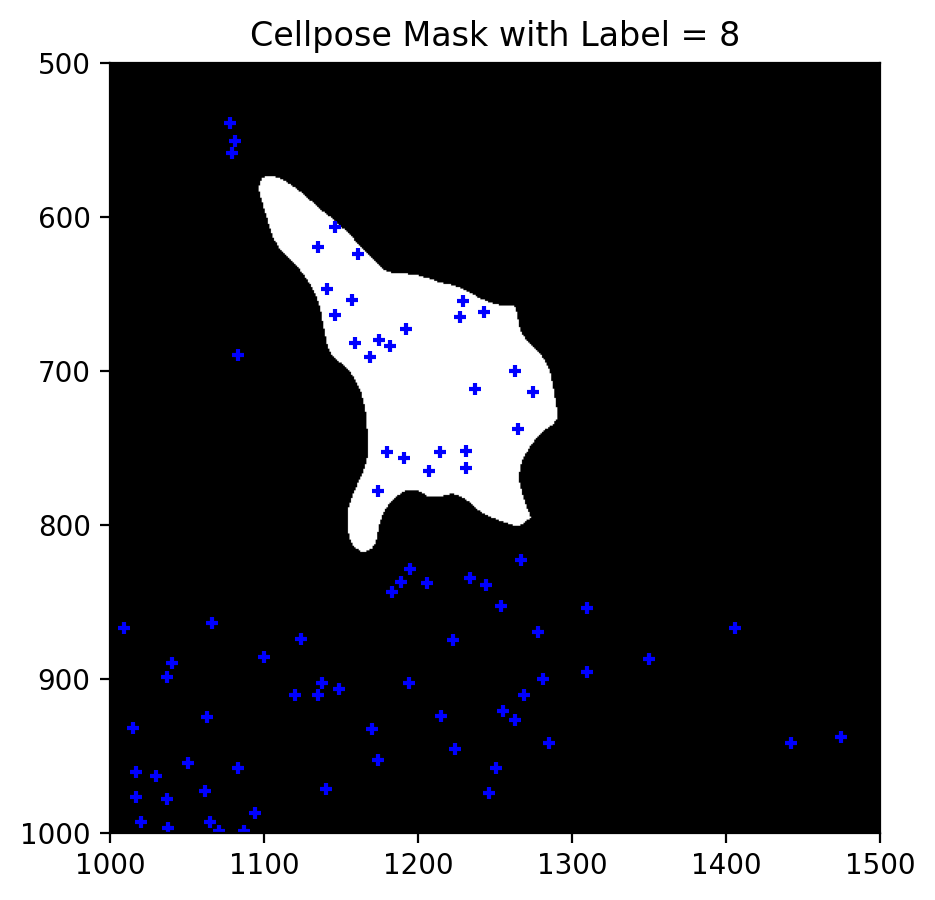

In [52]:
# show mask with label = 8
plt.figure(figsize=(5, 5), dpi=200)
plt.imshow(cmasks == 8, cmap='gray')
plt.title('Cellpose Mask with Label = 8')
plt.clim(0, 1)

for coord in coordinates:
    plt.scatter(coord[1], coord[0], c='blue', s=20, marker = '+')

plt.xlim(1000, 1500)
plt.ylim(1000, 500)
plt.show()

In [53]:
# compute the proportion of amplicons with label = 0 and > 0
total_amplicons = len(amp_df)
cyto_amplicons  = cyto_df['amplicon_count'].sum()

proportion_cyto = cyto_amplicons / total_amplicons

print(f"Amplicons within cytoplasm: {cyto_amplicons} / {total_amplicons} = {proportion_cyto:.2f}")


Amplicons within cytoplasm: 1045 / 1215 = 0.86


Boxplot of how amplicon count distribution looks like

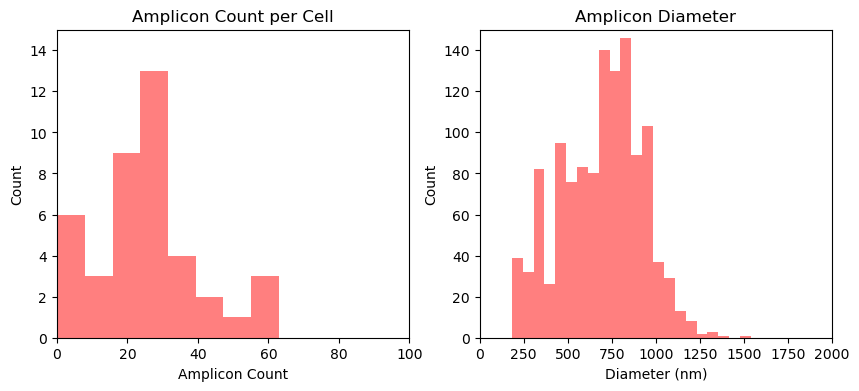

In [54]:
# plot a histogram of the amplicon count for each cellpose label
plt.figure(figsize=(10, 4), dpi=100)
plt.subplot(121)
plt.hist(cyto_df['amplicon_count'], bins='auto', color='red', alpha=0.5, label='Amplicon Count per Cell', density=False)
plt.title('Amplicon Count per Cell')
plt.xlim(0, 100)
plt.ylim(0, 15)
plt.xlabel('Amplicon Count')
plt.ylabel('Count')

# plot a histogram of the area for each amplicon
plt.subplot(122)
voxel_size = 0.1618437
diameter = np.sqrt(amp_df['area']/np.pi) * 2 * voxel_size * 1000
plt.hist(diameter, bins='auto', color='red', alpha=0.5, label='Amplicon diameter', density=False)
plt.xlim(0, 2000)
plt.ylim(0, 150)
plt.title('Amplicon Diameter')

plt.xlabel('Diameter (nm)')
plt.ylabel('Count')
plt.show()


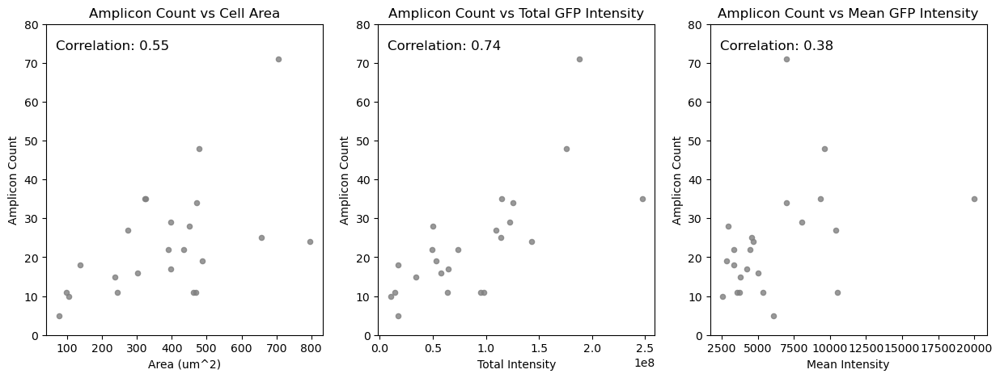

In [140]:
# remove those with amplicon count = 0
cyto_df_filtered = cyto_df[cyto_df['amplicon_count'] > 0]

# plot a scatter plot of amplicon count vs area
plt.figure(figsize=(15, 5), dpi=100)
plt.subplot(131)
plt.scatter(cyto_df_filtered['area'] * voxel_size**2, cyto_df_filtered['amplicon_count'], c='gray', alpha=0.8, s=20)
# add correlation value
corr = np.corrcoef(cyto_df_filtered['area'] * voxel_size**2, cyto_df_filtered['amplicon_count'])[0, 1]
plt.text(0.24, 0.93, f'Correlation: {corr:.2f}', fontsize=12, ha='center', va='center', transform=plt.gca().transAxes)
plt.ylim(0, 80)
plt.title('Amplicon Count vs Cell Area')
plt.xlabel('Area (um^2)')
plt.ylabel('Amplicon Count')

plt.subplot(132)
plt.scatter(cyto_df_filtered['total_intensity'], cyto_df_filtered['amplicon_count'], c='gray', alpha=0.8, s=20)
# add correlation value
corr = np.corrcoef(cyto_df_filtered['total_intensity'], cyto_df_filtered['amplicon_count'])[0, 1]
plt.text(0.24, 0.93, f'Correlation: {corr:.2f}', fontsize=12, ha='center', va='center', transform=plt.gca().transAxes)
plt.ylim(0, 80)
plt.title('Amplicon Count vs Total GFP Intensity')
plt.xlabel('Total Intensity')
plt.ylabel('Amplicon Count')

# plot a scatter plot of amplicon count vs mean intensity
plt.subplot(133)
plt.scatter(cyto_df_filtered['mean_intensity'], cyto_df_filtered['amplicon_count'], c='gray', alpha=0.8, s=20)
# add correlation value
corr = np.corrcoef(cyto_df_filtered['mean_intensity'], cyto_df_filtered['amplicon_count'])[0, 1]
plt.text(0.24, 0.93, f'Correlation: {corr:.2f}', fontsize=12, ha='center', va='center', transform=plt.gca().transAxes)
plt.ylim(0, 80)
plt.title('Amplicon Count vs Mean GFP Intensity')
plt.xlabel('Mean Intensity')
plt.ylabel('Amplicon Count')
plt.show()